In [10]:
import numpy as np 
import pandas as pd 
import os
import json
import seaborn as sns 
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')
import lightgbm as lgb
import xgboost as xgb
import time
import datetime
from PIL import Image
from wordcloud import WordCloud
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.metrics import mean_squared_error, roc_auc_score
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
import gc
from catboost import CatBoostClassifier
from tqdm import tqdm_notebook
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import random
import warnings
warnings.filterwarnings("ignore")
from functools import partial
import os
import scipy as sp
from math import sqrt
from collections import Counter
from sklearn.metrics import confusion_matrix as sk_cmatrix

from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize import TweetTokenizer
from sklearn.ensemble import RandomForestClassifier
import langdetect
import eli5
from IPython.display import display 

from sklearn.metrics import cohen_kappa_score
def kappa(y_true, y_pred):
    return cohen_kappa_score(y_true, y_pred, weights='quadratic')

In [12]:
folder_name = 'petfinder-adoption-prediction'

In [15]:
breeds = pd.read_csv(f'{folder_name}/breed_labels.csv') # 307 breeds
colors = pd.read_csv(f'{folder_name}/color_labels.csv') # 7 colors
states = pd.read_csv(f'{folder_name}/state_labels.csv') # 14 states

train = pd.read_csv(f'{folder_name}/train/train.csv')
test = pd.read_csv(f'{folder_name}/test/test.csv')
sub = pd.read_csv(f'{folder_name}/test/sample_submission.csv')

train['dataset_type'] = 'train'
test['dataset_type'] = 'test'
all_data = pd.concat([train, test])

In [20]:
print(os.listdir(f'{folder_name}'))

['test_images', 'breed_labels.csv', '.DS_Store', 'test', 'train_metadata', 'color_labels.csv', 'test_sentiment', 'test_metadata', 'StateLabels.csv', 'ColorLabels.csv', 'PetFinder-BreedLabels.csv', 'train_sentiment', 'train', 'BreedLabels.csv', 'PetFinder-ColorLabels.csv', 'train_images', 'PetFinder-StateLabels.csv', 'state_labels.csv']


In [22]:
train.info()
# We have almost 15 thousands dogs and cats in the dataset;
# Main dataset contains all important information about pets: age, breed, color, some characteristics and other things;
# Desctiptions were analyzed using Google's Natural Language API providing sentiments and entities. I suppose we could do a similar thing ourselves;
# There are photos of some pets;
# Some meta-information was extracted from images and we can use it;
# There are separate files with labels for breeds, colors and states;
# Target: Adoption speed (0-4) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14993 entries, 0 to 14992
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Type           14993 non-null  int64  
 1   Name           13728 non-null  object 
 2   Age            14993 non-null  int64  
 3   Breed1         14993 non-null  int64  
 4   Breed2         14993 non-null  int64  
 5   Gender         14993 non-null  int64  
 6   Color1         14993 non-null  int64  
 7   Color2         14993 non-null  int64  
 8   Color3         14993 non-null  int64  
 9   MaturitySize   14993 non-null  int64  
 10  FurLength      14993 non-null  int64  
 11  Vaccinated     14993 non-null  int64  
 12  Dewormed       14993 non-null  int64  
 13  Sterilized     14993 non-null  int64  
 14  Health         14993 non-null  int64  
 15  Quantity       14993 non-null  int64  
 16  Fee            14993 non-null  int64  
 17  State          14993 non-null  int64  
 18  Rescue

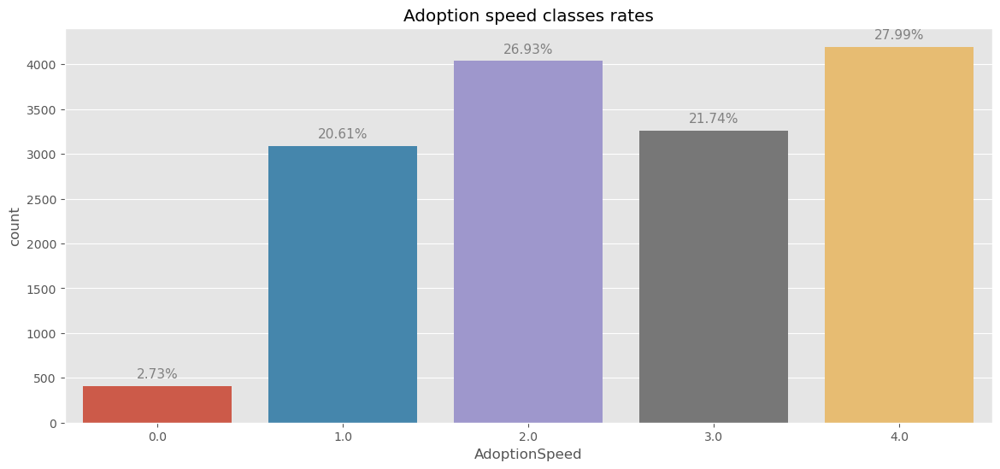

In [24]:
plt.figure(figsize=(14, 6));
g = sns.countplot(x='AdoptionSpeed', data=all_data.loc[all_data['dataset_type'] == 'train'])
plt.title('Adoption speed classes rates');
ax=g.axes
for p in ax.patches:
     ax.annotate(f"{p.get_height() * 100 / train.shape[0]:.2f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
         ha='center', va='center', fontsize=11, color='gray', rotation=0, xytext=(0, 10),
         textcoords='offset points')  

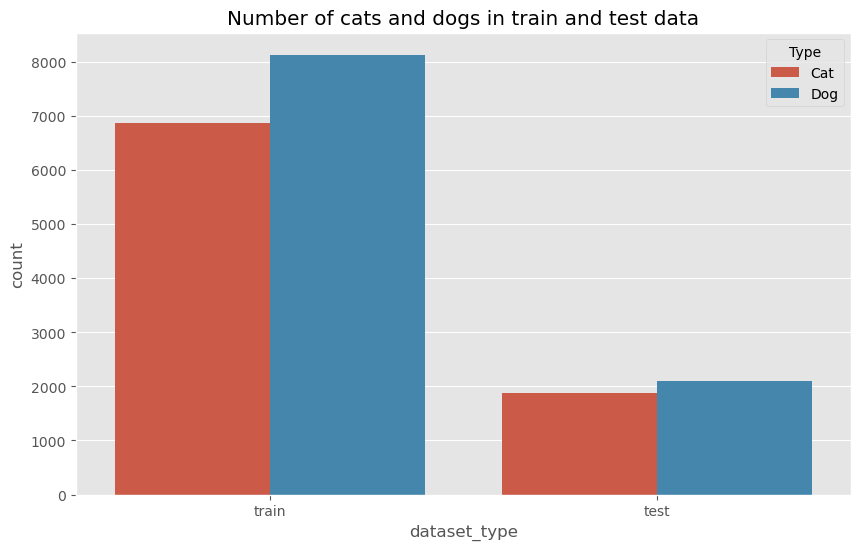

In [28]:
all_data['Type'] = all_data['Type'].apply(lambda x: 'Dog' if x == 1 else 'Cat')
plt.figure(figsize=(10, 6));
sns.countplot(x='dataset_type', data=all_data, hue='Type');
plt.title('Number of cats and dogs in train and test data');

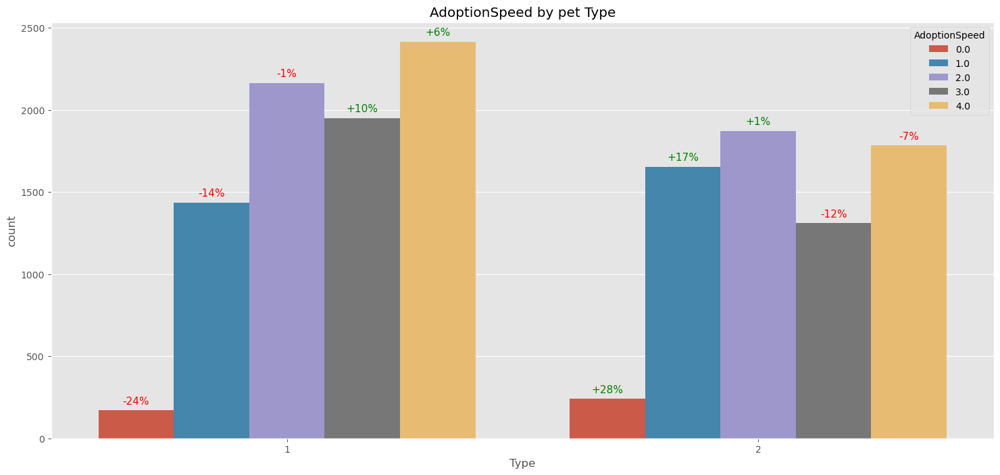

In [26]:
main_count = train['AdoptionSpeed'].value_counts(normalize=True).sort_index()

def prepare_plot_dict(df, col, main_count):
    """
    Preparing dictionary with data for plotting.
    
    I want to show how much higher/lower are the rates of Adoption speed for the current column comparing to base values (as described higher),
    At first I calculate base rates, then for each category in the column I calculate rates of Adoption speed and find difference with the base rates.
    
    """
    main_count = dict(main_count)
    plot_dict = {}
    for i in df[col].unique():
        val_count = dict(df.loc[df[col] == i, 'AdoptionSpeed'].value_counts().sort_index())

        for k, v in main_count.items():
            if k in val_count:
                plot_dict[val_count[k]] = ((val_count[k] / sum(val_count.values())) / main_count[k]) * 100 - 100
            else:
                plot_dict[0] = 0

    return plot_dict

def make_count_plot(df, x, hue='AdoptionSpeed', title='', main_count=main_count):
    """
    Plotting countplot with correct annotations.
    """
    g = sns.countplot(x=x, data=df, hue=hue);
    plt.title(f'AdoptionSpeed {title}');
    ax = g.axes

    plot_dict = prepare_plot_dict(df, x, main_count)

    for p in ax.patches:
        h = p.get_height() if str(p.get_height()) != 'nan' else 0
        text = f"{plot_dict[h]:.0f}%" if plot_dict[h] < 0 else f"+{plot_dict[h]:.0f}%"
        ax.annotate(text, (p.get_x() + p.get_width() / 2., h),
             ha='center', va='center', fontsize=11, color='green' if plot_dict[h] > 0 else 'red', rotation=0, xytext=(0, 10),
             textcoords='offset points')  

plt.figure(figsize=(18, 8));
make_count_plot(df=all_data.loc[all_data['dataset_type'] == 'train'], x='Type', title='by pet Type')

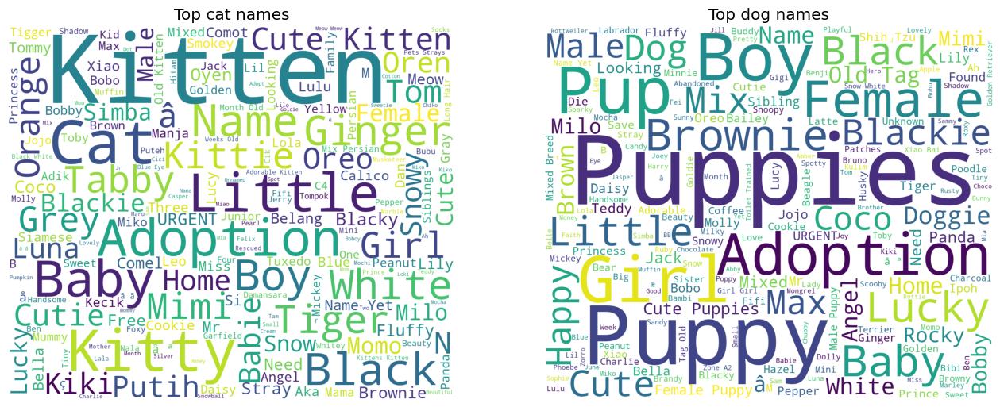

In [32]:
fig, ax = plt.subplots(figsize = (16, 12))
plt.subplot(1, 2, 1)
text_cat = ' '.join(all_data.loc[all_data['Type'] == 'Cat', 'Name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white',
                      width=1200, height=1000).generate(text_cat)
plt.imshow(wordcloud)
plt.title('Top cat names')
plt.axis("off")

plt.subplot(1, 2, 2)
text_dog = ' '.join(all_data.loc[all_data['Type'] == 'Dog', 'Name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white',
                      width=1200, height=1000).generate(text_dog)
plt.imshow(wordcloud)
plt.title('Top dog names')
plt.axis("off")

plt.show()

# Less than 10% of pets don't have names, but they have a higher possibility of not being adopted.
# Bad Names: <= 3 letters long

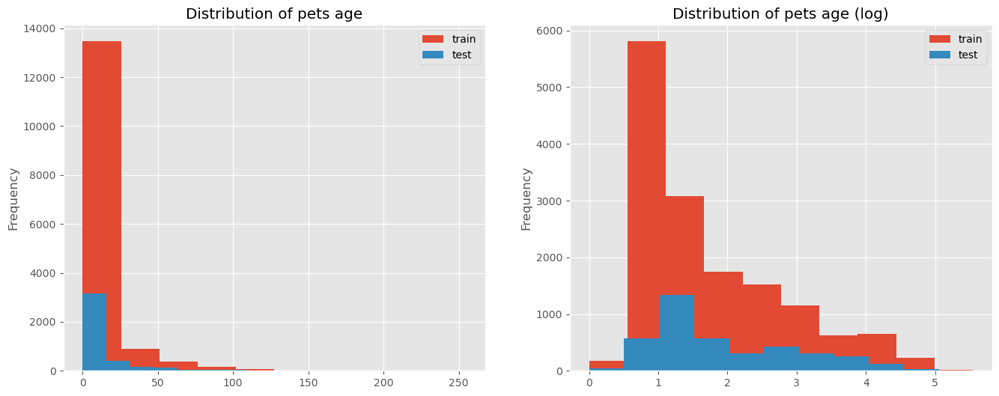

In [37]:
fig, ax = plt.subplots(figsize = (16, 6))
plt.subplot(1, 2, 1)
plt.title('Distribution of pets age');
train['Age'].plot(kind='hist', label='train');
test['Age'].plot(kind='hist', label='test');
plt.legend();

plt.subplot(1, 2, 2)
plt.title('Distribution of pets age (log)');
np.log1p(train['Age']).plot(kind='hist', label='train');
np.log1p(test['Age']).plot(kind='hist', label='test');
plt.legend();

In [38]:
train['Age'].value_counts().head(10)

Age
2     3503
1     2304
3     1966
4     1109
12     967
24     651
5      595
6      558
36     417
8      309
Name: count, dtype: int64

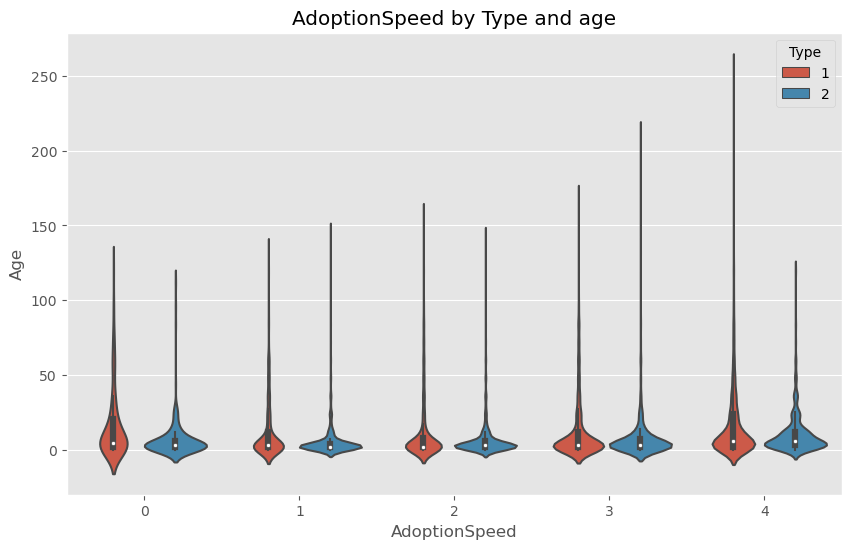

In [39]:
plt.figure(figsize=(10, 6));
sns.violinplot(x="AdoptionSpeed", y="Age", hue="Type", data=train);
plt.title('AdoptionSpeed by Type and age');

In [40]:
data = []
for a in range(5):
    df = train.loc[train['AdoptionSpeed'] == a]

    data.append(go.Scatter(
        x = df['Age'].value_counts().sort_index().index,
        y = df['Age'].value_counts().sort_index().values,
        name = str(a)
    ))
    
layout = go.Layout(dict(title = "AdoptionSpeed trends by Age",
                  xaxis = dict(title = 'Age (months)'),
                  yaxis = dict(title = 'Counts'),
                  )
                  )
py.iplot(dict(data=data, layout=layout), filename='basic-line')

Rate of pure breed pets in train data: 71.7802%.
Rate of pure breed pets in test data: 74.6979%.


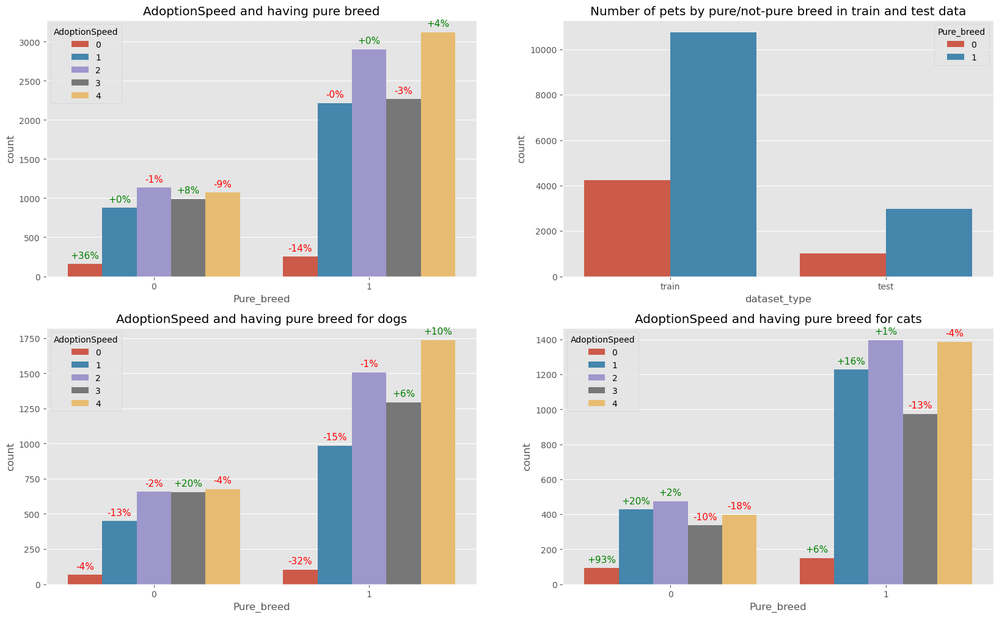

In [41]:
train['Pure_breed'] = 0
train.loc[train['Breed2'] == 0, 'Pure_breed'] = 1
test['Pure_breed'] = 0
test.loc[test['Breed2'] == 0, 'Pure_breed'] = 1
all_data['Pure_breed'] = 0
all_data.loc[all_data['Breed2'] == 0, 'Pure_breed'] = 1

print(f"Rate of pure breed pets in train data: {train['Pure_breed'].sum() * 100 / train['Pure_breed'].shape[0]:.4f}%.")
print(f"Rate of pure breed pets in test data: {test['Pure_breed'].sum() * 100 / test['Pure_breed'].shape[0]:.4f}%.")

def plot_four_graphs(col='', main_title='', dataset_title=''):
    """
    Plotting four graphs:
    - adoption speed by variable;
    - counts of categories in the variable in train and test;
    - adoption speed by variable for dogs;
    - adoption speed by variable for cats;    
    """
    plt.figure(figsize=(20, 12));
    plt.subplot(2, 2, 1)
    make_count_plot(df=train, x=col, title=f'and {main_title}')

    plt.subplot(2, 2, 2)
    sns.countplot(x='dataset_type', data=all_data, hue=col);
    plt.title(dataset_title);

    plt.subplot(2, 2, 3)
    make_count_plot(df=train.loc[train['Type'] == 1], x=col, title=f'and {main_title} for dogs')

    plt.subplot(2, 2, 4)
    make_count_plot(df=train.loc[train['Type'] == 2], x=col, title=f'and {main_title} for cats')
    
plot_four_graphs(col='Pure_breed', main_title='having pure breed', dataset_title='Number of pets by pure/not-pure breed in train and test data')

In [57]:
breeds_dict = {k: v for k, v in zip(breeds['BreedID'], breeds['BreedName'])}
breeds_dict[0] = 'Missing'

In [96]:
train['Breed1_name'] = train['Breed1'].apply(lambda x: '_'.join(breeds_dict[x].split()) if x in breeds_dict else 'Unknown')
train['Breed2_name'] = train['Breed2'].apply(lambda x: '_'.join(breeds_dict[x]) if x in breeds_dict else '-')

test['Breed1_name'] = test['Breed1'].apply(lambda x: '_'.join(breeds_dict[x].split()) if x in breeds_dict else 'Unknown')
test['Breed2_name'] = test['Breed2'].apply(lambda x: '_'.join(breeds_dict[x].split()) if x in breeds_dict else '-')

all_data['Breed1_name'] = all_data['Breed1'].apply(lambda x: '_'.join(breeds_dict[x].split()) if x in breeds_dict else 'Unknown')
all_data['Breed2_name'] = all_data['Breed2'].apply(lambda x: '_'.join(breeds_dict[x].split()) if x in breeds_dict else '-')

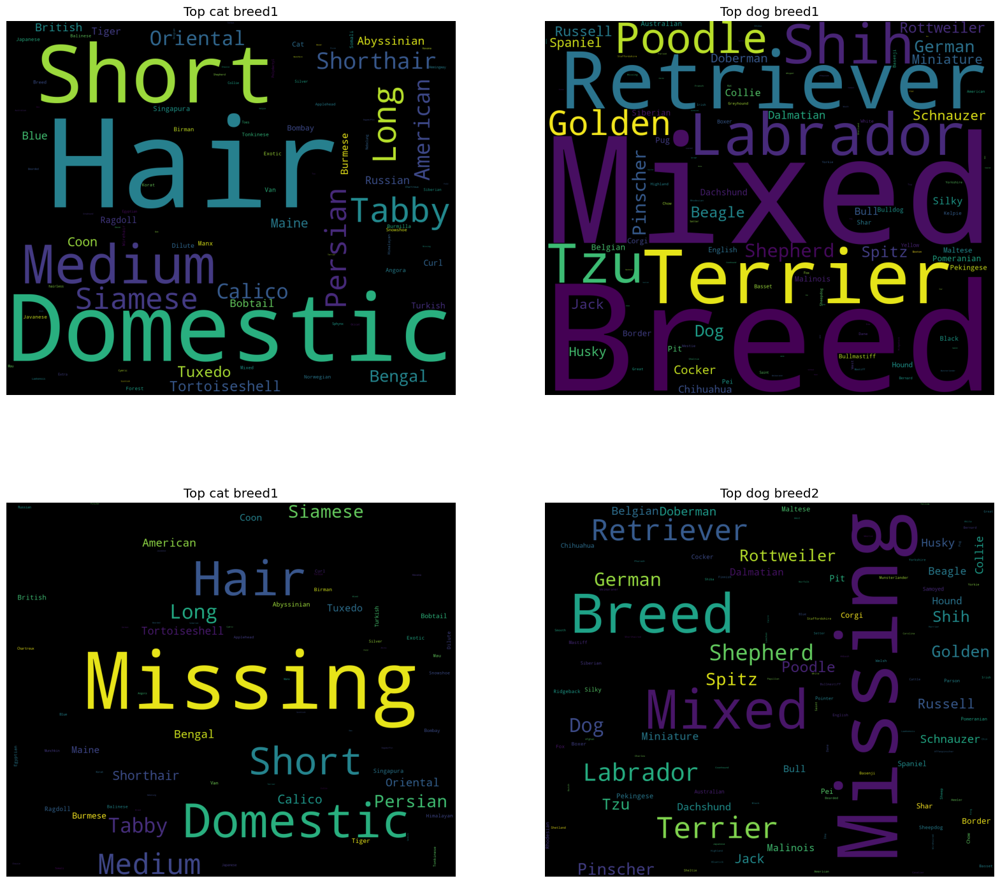

In [60]:
fig, ax = plt.subplots(figsize = (20, 18))
plt.subplot(2, 2, 1)
text_cat1 = ' '.join([breeds_dict[i] for i in all_data.loc[all_data['Type'] == 'Cat', 'Breed1'].fillna(0).values])
wordcloud = WordCloud(max_font_size=None, background_color='black', collocations=False,
                      width=1200, height=1000).generate(text_cat1)
plt.imshow(wordcloud)
plt.title('Top cat breed1')
plt.axis("off")

plt.subplot(2, 2, 2)
text_dog1 = ' '.join([breeds_dict[i] for i in all_data.loc[all_data['Type'] == 'Dog', 'Breed1'].fillna(0).values])
wordcloud = WordCloud(max_font_size=None, background_color='black', collocations=False,
                      width=1200, height=1000).generate(text_dog1)
plt.imshow(wordcloud)
plt.title('Top dog breed1')
plt.axis("off")

plt.subplot(2, 2, 3)
text_cat2 = ' '.join([breeds_dict[i] for i in all_data.loc[all_data['Type'] == 'Cat', 'Breed2'].fillna(0).values])
wordcloud = WordCloud(max_font_size=None, background_color='black', collocations=False,
                      width=1200, height=1000).generate(text_cat2)
plt.imshow(wordcloud)
plt.title('Top cat breed1')
plt.axis("off")

plt.subplot(2, 2, 4)
text_dog2 = ' '.join([breeds_dict[i] for i in all_data.loc[all_data['Type'] == 'Dog', 'Breed2'].fillna(0).values])
wordcloud = WordCloud(max_font_size=None, background_color='black', collocations=False,
                      width=1200, height=1000).generate(text_dog2)
plt.imshow(wordcloud)
plt.title('Top dog breed2')
plt.axis("off")
plt.show()

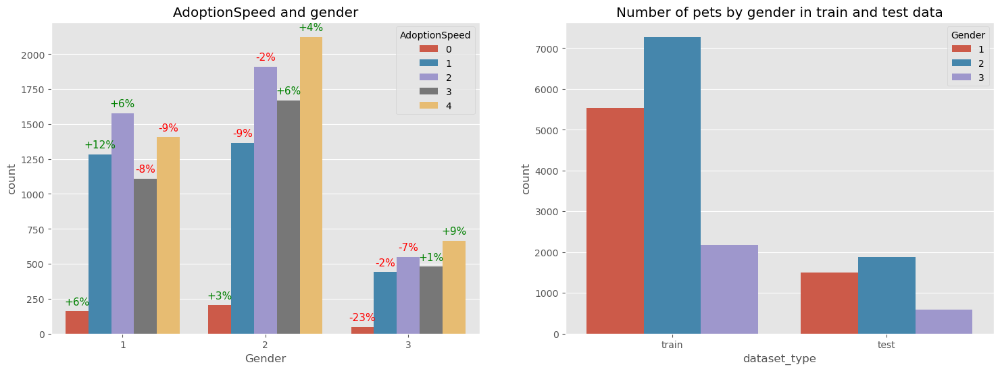

In [61]:
plt.figure(figsize=(18, 6));
plt.subplot(1, 2, 1)
make_count_plot(df=train, x='Gender', title='and gender')

plt.subplot(1, 2, 2)
sns.countplot(x='dataset_type', data=all_data, hue='Gender');
plt.title('Number of pets by gender in train and test data');

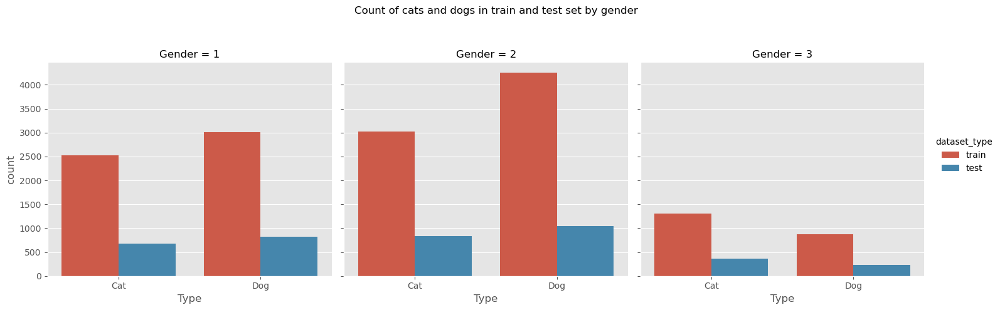

In [65]:
sns.catplot(x='Type', col='Gender', data=all_data, kind='count', hue='dataset_type')
plt.subplots_adjust(top=0.8)
plt.suptitle('Count of cats and dogs in train and test set by gender');

In [67]:
colors_dict = {k: v for k, v in zip(colors['ColorID'], colors['ColorName'])}
train['Color1_name'] = train['Color1'].apply(lambda x: colors_dict[x] if x in colors_dict else '')
train['Color2_name'] = train['Color2'].apply(lambda x: colors_dict[x] if x in colors_dict else '')
train['Color3_name'] = train['Color3'].apply(lambda x: colors_dict[x] if x in colors_dict else '')

test['Color1_name'] = test['Color1'].apply(lambda x: colors_dict[x] if x in colors_dict else '')
test['Color2_name'] = test['Color2'].apply(lambda x: colors_dict[x] if x in colors_dict else '')
test['Color3_name'] = test['Color3'].apply(lambda x: colors_dict[x] if x in colors_dict else '')

all_data['Color1_name'] = all_data['Color1'].apply(lambda x: colors_dict[x] if x in colors_dict else '')
all_data['Color2_name'] = all_data['Color2'].apply(lambda x: colors_dict[x] if x in colors_dict else '')
all_data['Color3_name'] = all_data['Color3'].apply(lambda x: colors_dict[x] if x in colors_dict else '')

In [76]:
def make_factor_plot(df, x, col, title, main_count=main_count, hue=None, ann=True, col_wrap=4):
    """
    Plotting countplot.
    Making annotations is a bit more complicated, because we need to iterate over axes.
    """
    if hue:
        g = sns.catplot(col=x, x=col, data=df, kind='count', col_wrap=col_wrap, hue=hue)
    else:
        g = sns.catplot(col=x, x=col, data=df, kind='count', col_wrap=col_wrap);
    plt.subplots_adjust(top=0.9);
    plt.suptitle(title);
    ax = g.axes
    plot_dict = prepare_plot_dict(df, x, main_count)
    if ann:
        for a in ax:
            for p in a.patches:
                text = f"{plot_dict[p.get_height()]:.0f}%" if plot_dict[p.get_height()] < 0 else f"+{plot_dict[p.get_height()]:.0f}%"
                a.annotate(text, (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', fontsize=11, color='green' if plot_dict[p.get_height()] > 0 else 'red', rotation=0, xytext=(0, 10),
                     textcoords='offset points')  

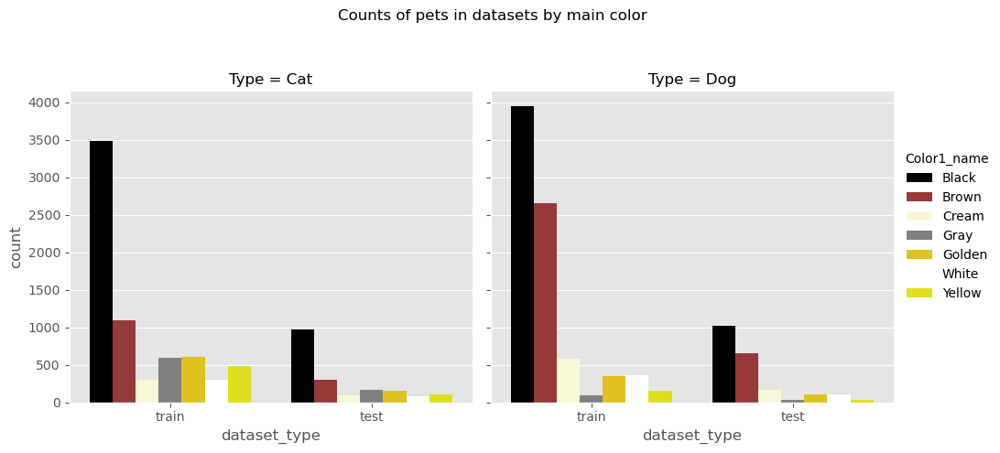

In [74]:
palette = ['Black', 'Brown', '#FFFDD0', 'Gray', 'Gold', 'White', 'Yellow']
sns.catplot(x='dataset_type', col='Type', data=all_data, kind='count', hue='Color1_name', palette=palette)
plt.subplots_adjust(top=0.8)
plt.suptitle('Counts of pets in datasets by main color');

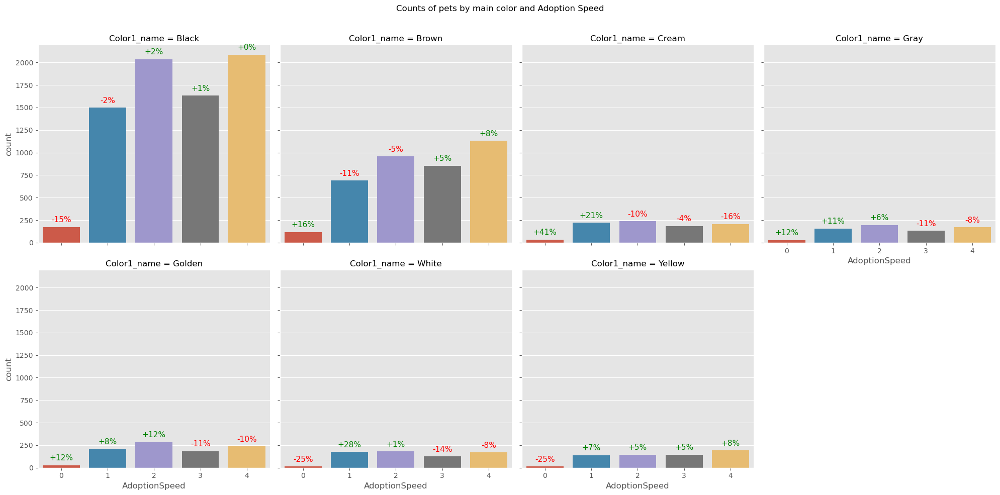

In [77]:
make_factor_plot(df=train, x='Color1_name', col='AdoptionSpeed', title='Counts of pets by main color and Adoption Speed')

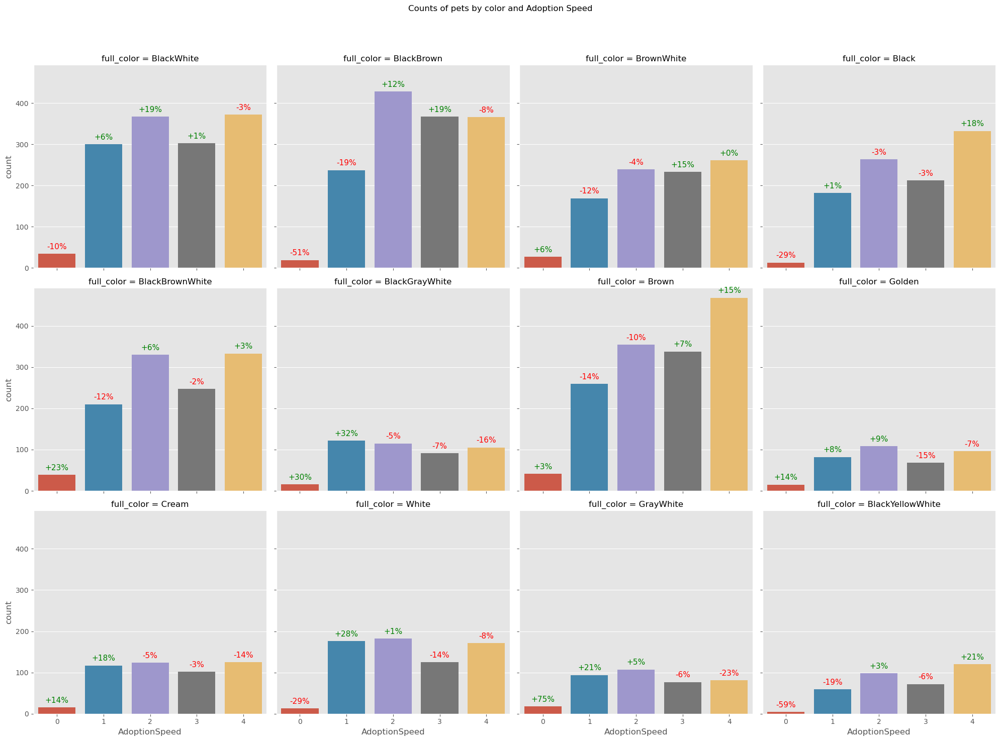

In [78]:
train['full_color'] = (train['Color1_name'] + '__' + train['Color2_name'] + '__' + train['Color3_name']).str.replace('__', '')
test['full_color'] = (test['Color1_name'] + '__' + test['Color2_name'] + '__' + test['Color3_name']).str.replace('__', '')
all_data['full_color'] = (all_data['Color1_name'] + '__' + all_data['Color2_name'] + '__' + all_data['Color3_name']).str.replace('__', '')

make_factor_plot(df=train.loc[train['full_color'].isin(list(train['full_color'].value_counts().index)[:12])], x='full_color', col='AdoptionSpeed', title='Counts of pets by color and Adoption Speed')

In [79]:
gender_dict = {1: 'Male', 2: 'Female', 3: 'Mixed'}
for i in all_data['Type'].unique():
    for j in all_data['Gender'].unique():
        df = all_data.loc[(all_data['Type'] == i) & (all_data['Gender'] == j)]
        top_colors = list(df['full_color'].value_counts().index)[:5]
        j = gender_dict[j]
        print(f"Most popular colors of {j} {i}s: {' '.join(top_colors)}")

Most popular colors of Male Cats: BlackWhite Black GrayWhite White YellowWhite
Most popular colors of Female Cats: BlackWhite BlackBrownWhite BlackYellowWhite GrayWhite White
Most popular colors of Mixed Cats: BlackBrownWhite BlackGrayWhite BlackYellowWhite BlackWhite BlackGoldenWhite
Most popular colors of Male Dogs: Brown BlackBrown BrownWhite Black BlackWhite
Most popular colors of Female Dogs: Brown BlackBrown BrownWhite Black BlackWhite
Most popular colors of Mixed Dogs: BlackBrownWhite BlackBrown BlackBrownCream Brown BlackWhite


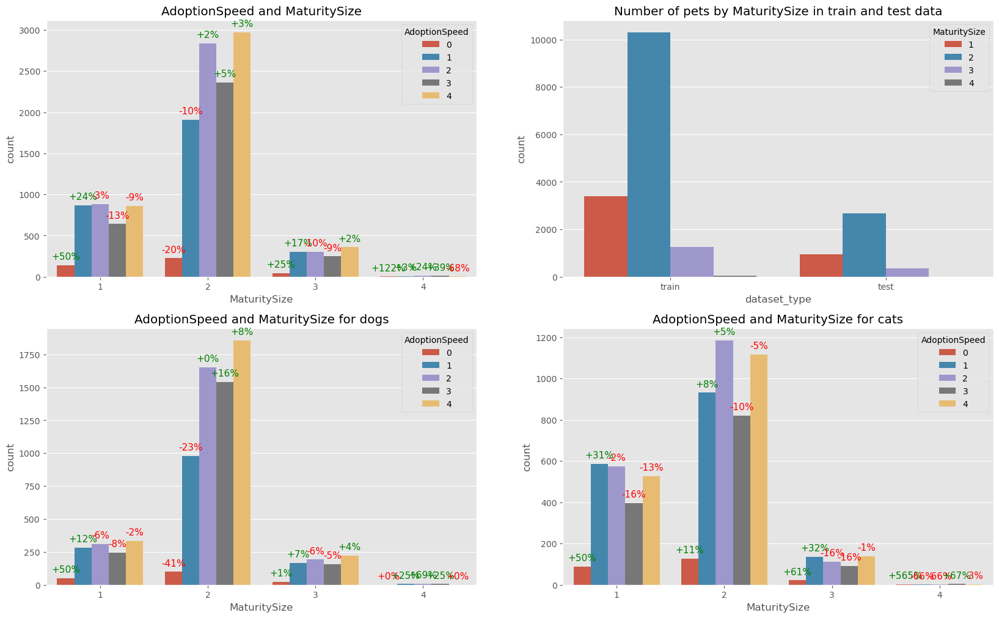

In [80]:
plot_four_graphs(col='MaturitySize', main_title='MaturitySize', dataset_title='Number of pets by MaturitySize in train and test data')

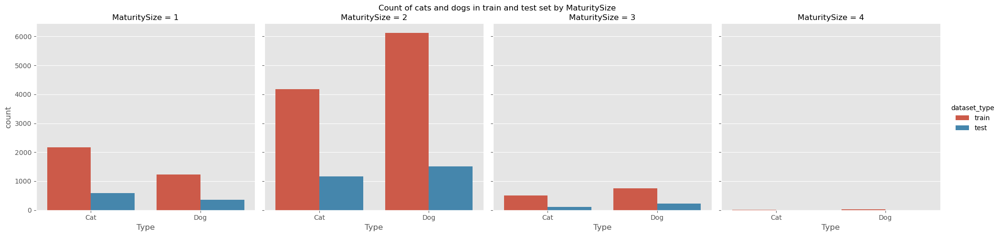

In [81]:
make_factor_plot(df=all_data, x='MaturitySize', col='Type', title='Count of cats and dogs in train and test set by MaturitySize', hue='dataset_type', ann=False)

Most common Breeds of Small Cats:


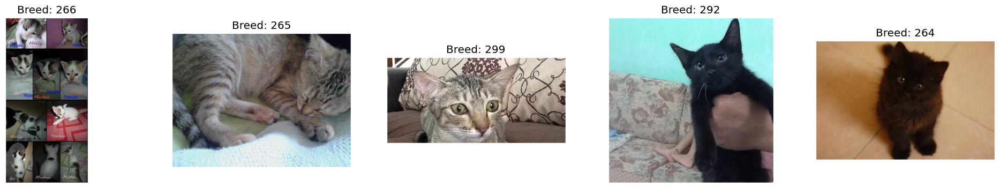

Most common Breeds of Medium Cats:


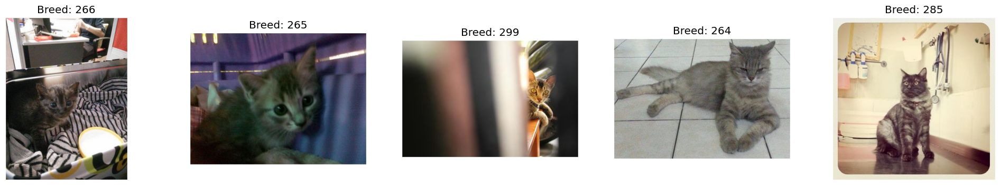

Most common Breeds of Large Cats:


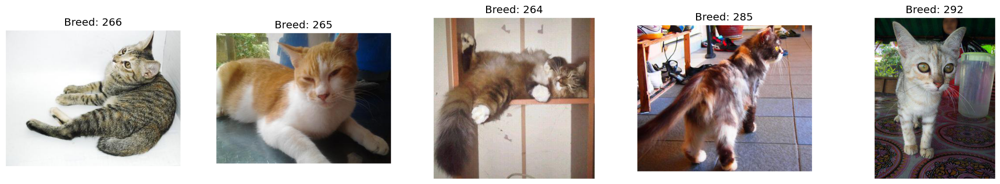

Most common Breeds of Extra Large Cats:


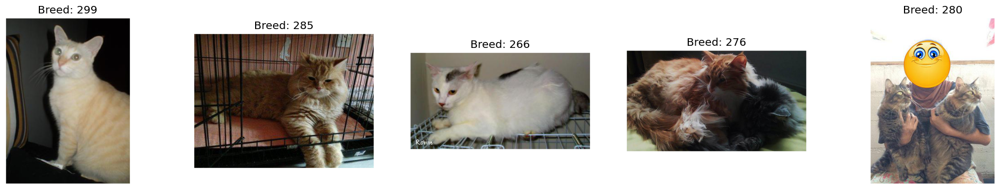

Most common Breeds of Small Dogs:


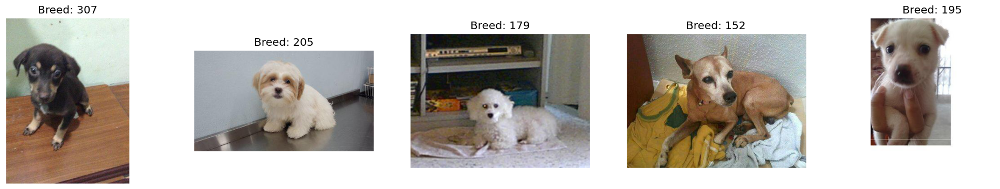

Most common Breeds of Medium Dogs:


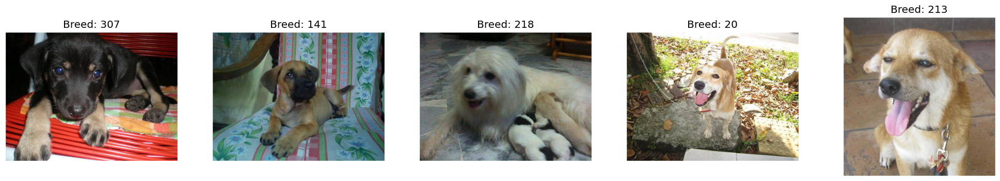

Most common Breeds of Large Dogs:


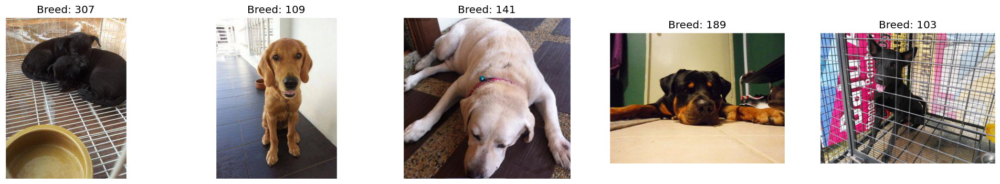

Most common Breeds of Extra Large Dogs:


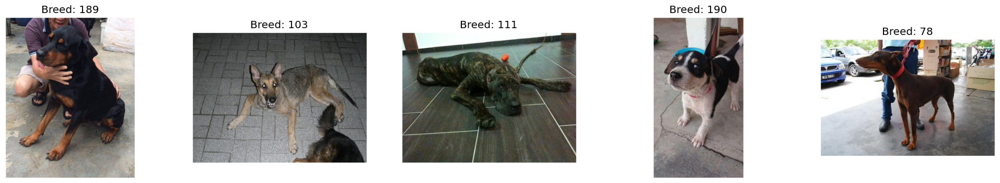

In [92]:
images = [i.split('-')[0] for i in os.listdir(f'{folder_name}/train_images/')]
size_dict = {1: 'Small', 2: 'Medium', 3: 'Large', 4: 'Extra Large'}
for t in all_data['Type'].unique():
    for m in all_data['MaturitySize'].unique():
        df = all_data.loc[(all_data['Type'] == t) & (all_data['MaturitySize'] == m)]
        top_breeds = list(df['Breed1'].value_counts().index)[:5]
        m = size_dict[m]
        print(f"Most common Breeds of {m} {t}s:")
        
        fig = plt.figure(figsize=(25, 4))
        
        for i, breed in enumerate(top_breeds):
            # excluding pets without pictures
            b_df = df.loc[(df['Breed1'] == breed) & (df['PetID'].isin(images)), 'PetID']
            if len(b_df) > 1:
                pet_id = b_df.values[1]
            else:
                pet_id = b_df.values[0]
            ax = fig.add_subplot(1, 5, i+1, xticks=[], yticks=[])

            im = Image.open(f'{folder_name}/train_images/' + pet_id + '-1.jpg')
            plt.imshow(im)
            ax.set_title(f'Breed: {breed}')
        plt.show();

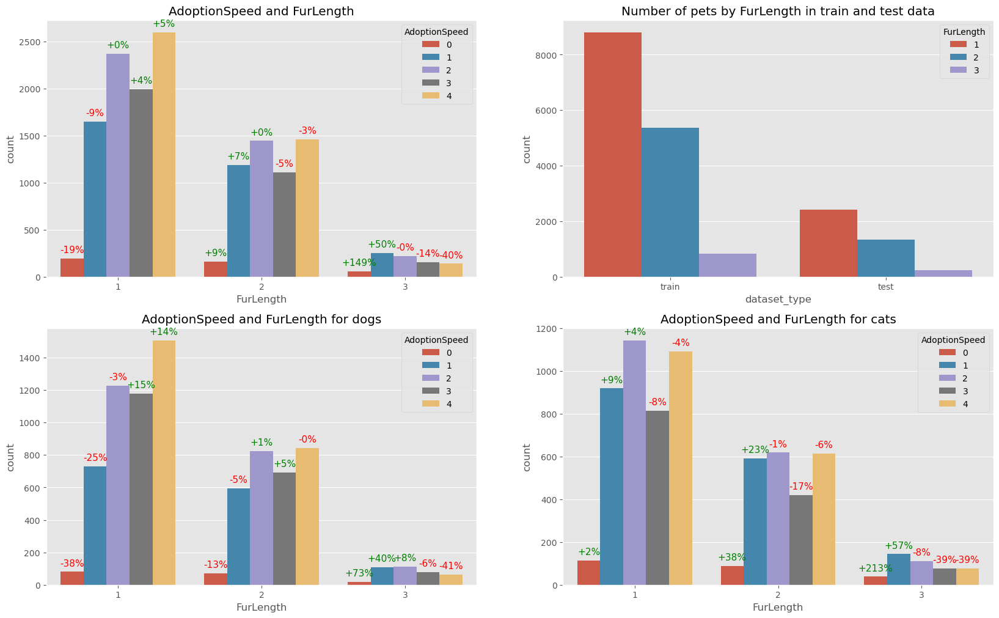

In [93]:
plot_four_graphs(col='FurLength', main_title='FurLength', dataset_title='Number of pets by FurLength in train and test data')

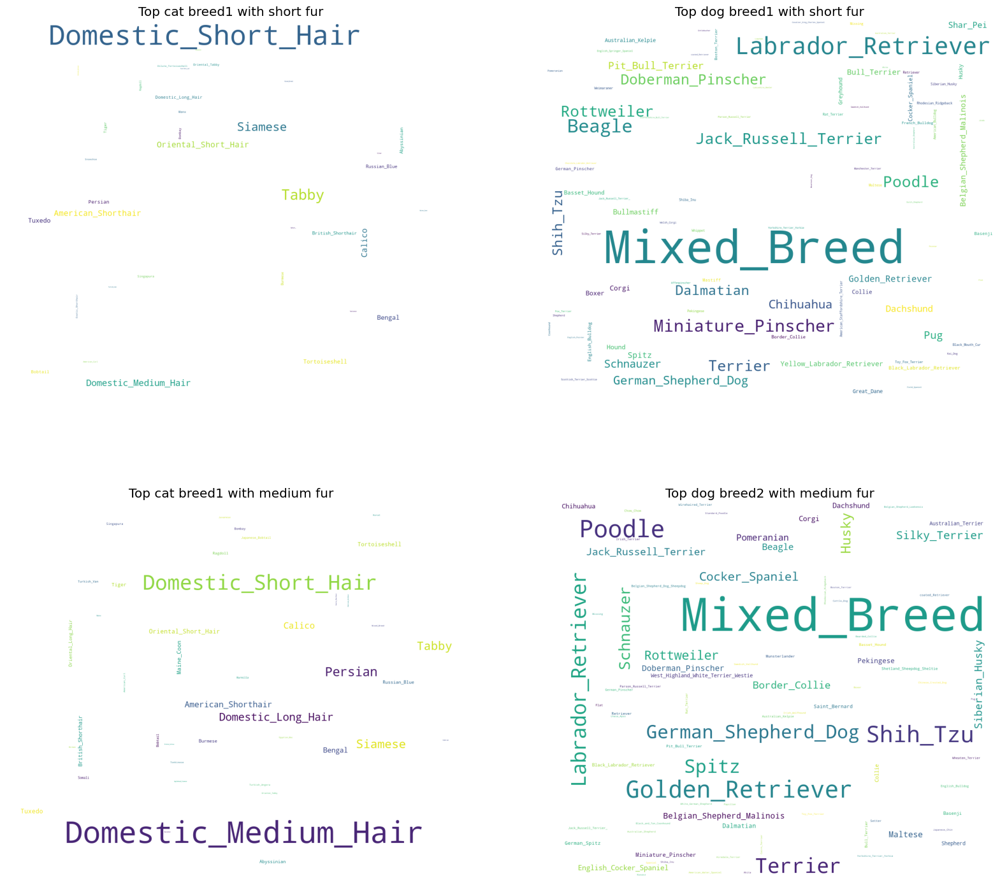

In [98]:
fig, ax = plt.subplots(figsize = (20, 18))
plt.subplot(2, 2, 1)
text_cat1 = ' '.join(all_data.loc[(all_data['FurLength'] == 1) & (all_data['Type'] == 'Cat'), 'Breed1_name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1200, height=1000).generate(text_cat1)
plt.imshow(wordcloud)
plt.title('Top cat breed1 with short fur')
plt.axis("off")

plt.subplot(2, 2, 2)
text_dog1 = ' '.join(all_data.loc[(all_data['FurLength'] == 1) & (all_data['Type'] == 'Dog'), 'Breed1_name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1200, height=1000).generate(text_dog1)
plt.imshow(wordcloud)
plt.title('Top dog breed1 with short fur')
plt.axis("off")

plt.subplot(2, 2, 3)
text_cat2 = ' '.join(all_data.loc[(all_data['FurLength'] == 2) & (all_data['Type'] == 'Cat'), 'Breed1_name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1200, height=1000).generate(text_cat2)
plt.imshow(wordcloud)
plt.title('Top cat breed1 with medium fur')
plt.axis("off")

plt.subplot(2, 2, 4)
text_dog2 = ' '.join(all_data.loc[(all_data['FurLength'] == 2) & (all_data['Type'] == 'Dog'), 'Breed1_name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1200, height=1000).generate(text_dog2)
plt.imshow(wordcloud)
plt.title('Top dog breed2 with medium fur')
plt.axis("off")
plt.show()

In [99]:
c = 0
strange_pets = []
for i, row in all_data[all_data['Breed1_name'].str.contains('air')].iterrows():
    if 'Short' in row['Breed1_name'] and row['FurLength'] == 1:
        pass
    elif 'Medium' in row['Breed1_name'] and row['FurLength'] == 2:
        pass
    elif 'Long' in row['Breed1_name'] and row['FurLength'] == 3:
        pass
    else:
        c += 1
        strange_pets.append((row['PetID'], row['Breed1_name'], row['FurLength']))
        
print(f"There are {c} pets whose breed and fur length don't match")

There are 921 pets whose breed and fur length don't match


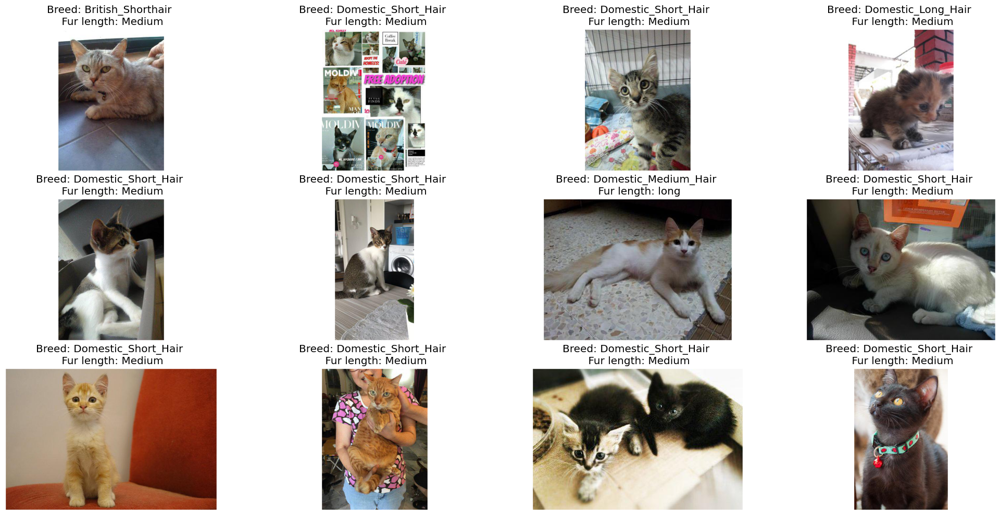

In [101]:
strange_pets = [p for p in strange_pets if p[0] in images]
fig = plt.figure(figsize=(25, 12))
fur_dict = {1: 'Short', 2: 'Medium', 3: 'long'}
for i, s in enumerate(random.sample(strange_pets, 12)):
    ax = fig.add_subplot(3, 4, i+1, xticks=[], yticks=[])

    im = Image.open(f'{folder_name}/train_images/' + s[0] + '-1.jpg')
    plt.imshow(im)
    ax.set_title(f'Breed: {s[1]} \n Fur length: {fur_dict[s[2]]}')
plt.show();

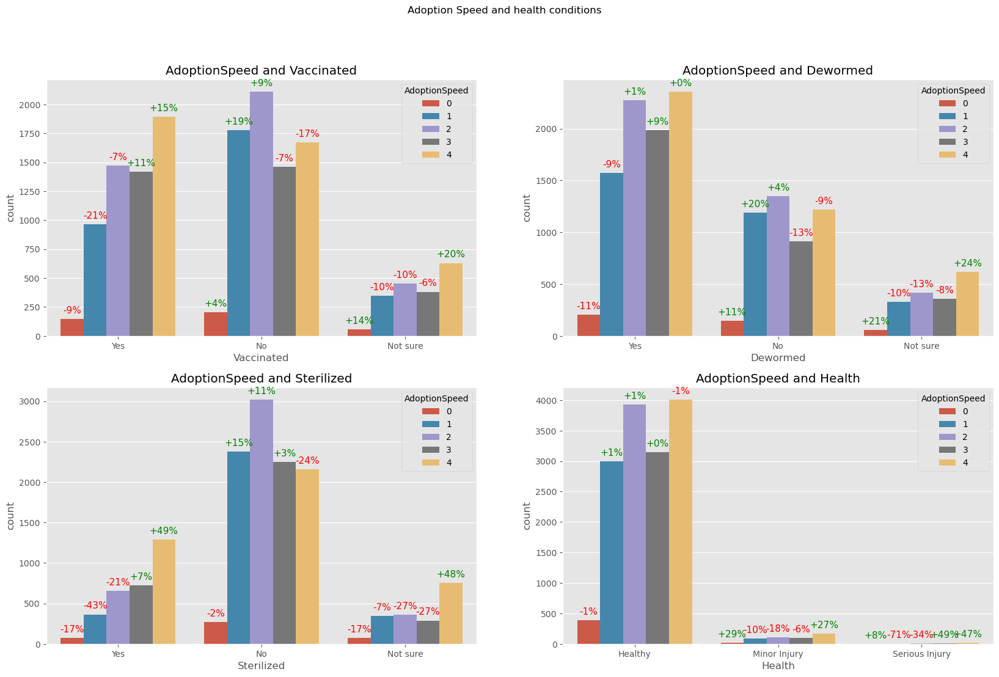

In [102]:
plt.figure(figsize=(20, 12));
plt.subplot(2, 2, 1)
make_count_plot(df=train, x='Vaccinated', title='Vaccinated')
plt.xticks([0, 1, 2], ['Yes', 'No', 'Not sure']);
plt.title('AdoptionSpeed and Vaccinated');

plt.subplot(2, 2, 2)
make_count_plot(df=train, x='Dewormed', title='Dewormed')
plt.xticks([0, 1, 2], ['Yes', 'No', 'Not sure']);
plt.title('AdoptionSpeed and Dewormed');

plt.subplot(2, 2, 3)
make_count_plot(df=train, x='Sterilized', title='Sterilized')
plt.xticks([0, 1, 2], ['Yes', 'No', 'Not sure']);
plt.title('AdoptionSpeed and Sterilized');

plt.subplot(2, 2, 4)
make_count_plot(df=train, x='Health', title='Health')
plt.xticks([0, 1, 2], ['Healthy', 'Minor Injury', 'Serious Injury']);
plt.title('AdoptionSpeed and Health');

plt.suptitle('Adoption Speed and health conditions');

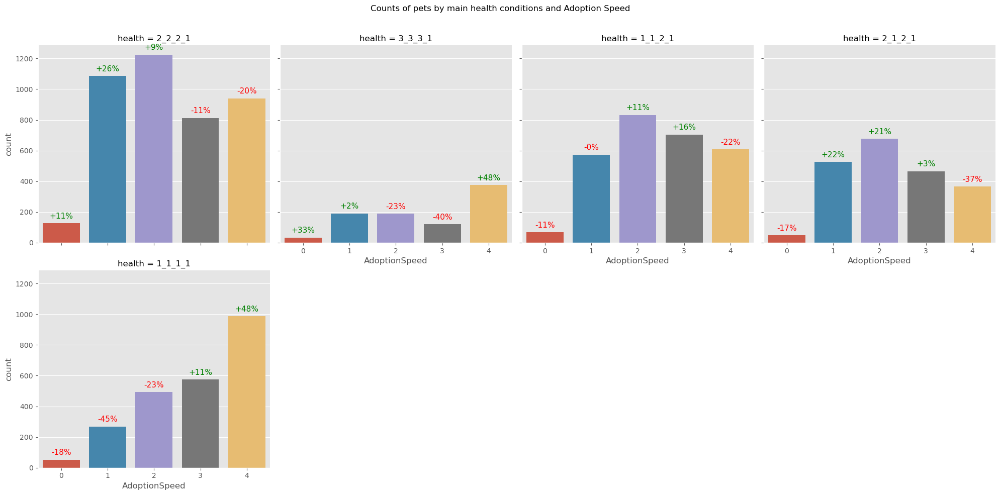

In [104]:
train['health'] = train['Vaccinated'].astype(str) + '_' + train['Dewormed'].astype(str) + '_' + train['Sterilized'].astype(str) + '_' + train['Health'].astype(str)
test['health'] = test['Vaccinated'].astype(str) + '_' + test['Dewormed'].astype(str) + '_' + test['Sterilized'].astype(str) + '_' + test['Health'].astype(str)

make_factor_plot(df=train.loc[train['health'].isin(list(train.health.value_counts().index[:5]))], x='health', col='AdoptionSpeed', title='Counts of pets by main health conditions and Adoption Speed')

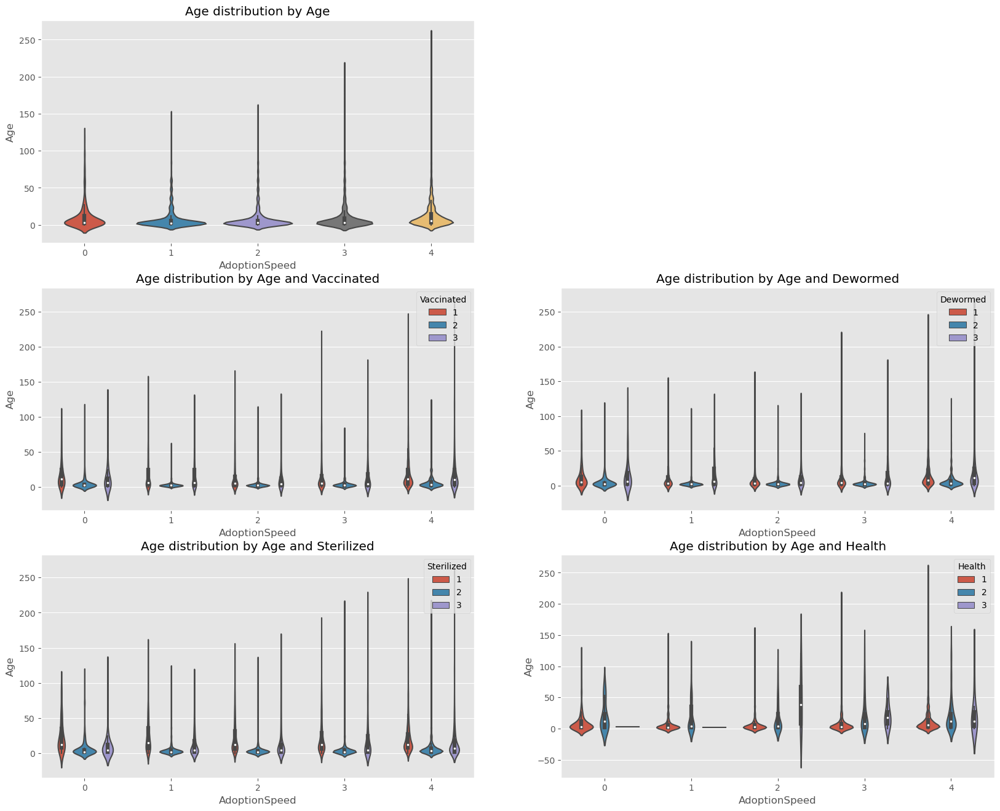

In [105]:
plt.figure(figsize=(20, 16))
plt.subplot(3, 2, 1)
sns.violinplot(x="AdoptionSpeed", y="Age", data=train);
plt.title('Age distribution by Age');
plt.subplot(3, 2, 3)
sns.violinplot(x="AdoptionSpeed", y="Age", hue="Vaccinated", data=train);
plt.title('Age distribution by Age and Vaccinated');
plt.subplot(3, 2, 4)
sns.violinplot(x="AdoptionSpeed", y="Age", hue="Dewormed", data=train);
plt.title('Age distribution by Age and Dewormed');
plt.subplot(3, 2, 5)
sns.violinplot(x="AdoptionSpeed", y="Age", hue="Sterilized", data=train);
plt.title('Age distribution by Age and Sterilized');
plt.subplot(3, 2, 6)
sns.violinplot(x="AdoptionSpeed", y="Age", hue="Health", data=train);
plt.title('Age distribution by Age and Health');

In [106]:
train.loc[train['Quantity'] > 11][['Name', 'Description', 'Quantity', 'AdoptionSpeed']].head(10)
# sometimes there are several pets in one advertisement.
train['Quantity'].value_counts().head(10)

Quantity
1     11565
2      1422
3       726
4       531
5       333
6       185
7        84
8        52
9        33
10       19
Name: count, dtype: int64

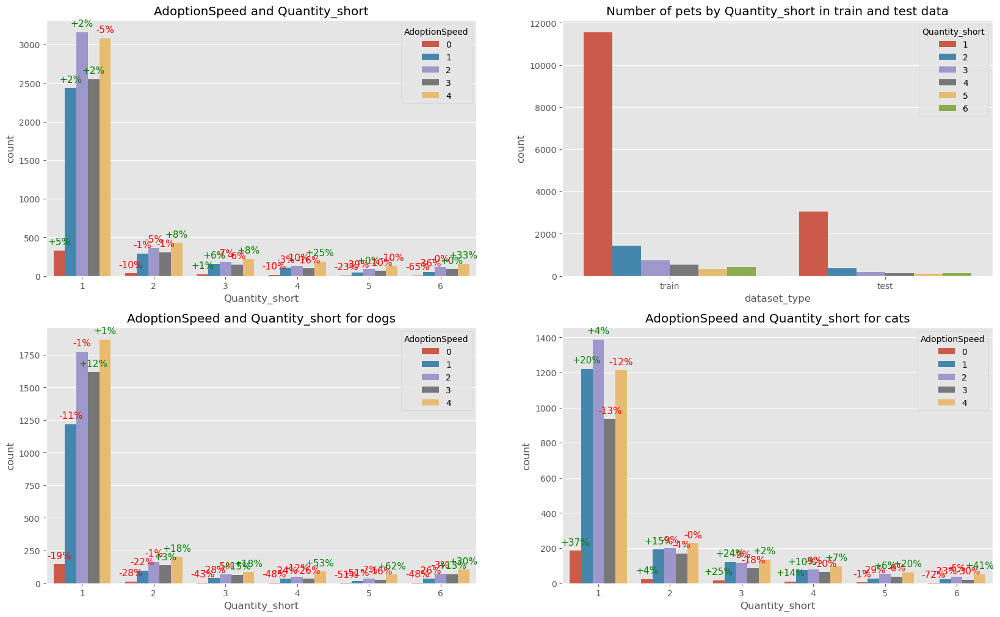

In [107]:
train['Quantity_short'] = train['Quantity'].apply(lambda x: x if x <= 5 else 6)
test['Quantity_short'] = test['Quantity'].apply(lambda x: x if x <= 5 else 6)
all_data['Quantity_short'] = all_data['Quantity'].apply(lambda x: x if x <= 5 else 6)
plot_four_graphs(col='Quantity_short', main_title='Quantity_short', dataset_title='Number of pets by Quantity_short in train and test data')

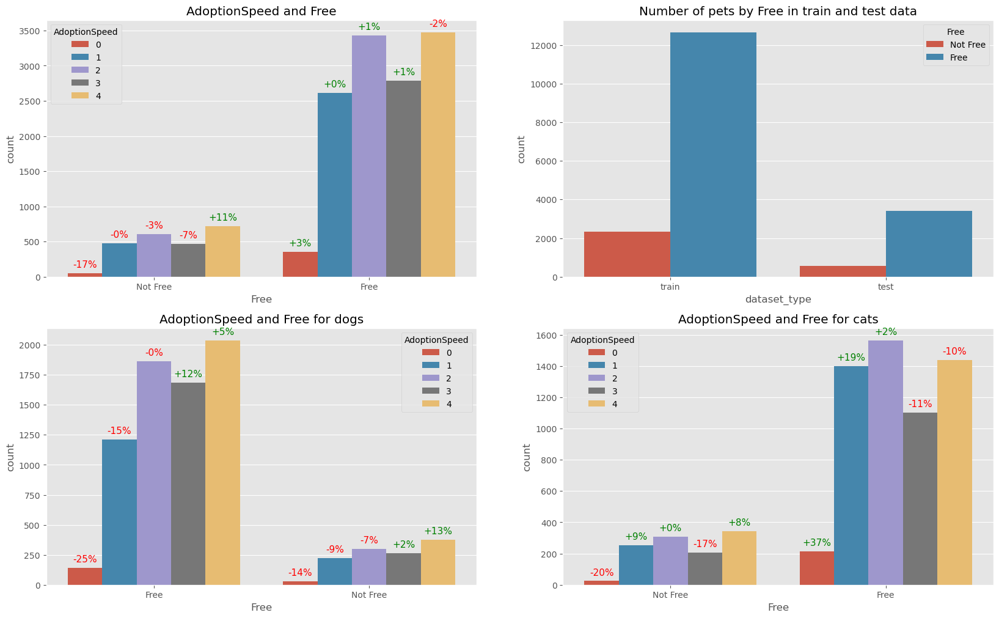

In [108]:
train['Free'] = train['Fee'].apply(lambda x: 'Free' if x == 0 else 'Not Free')
test['Free'] = test['Fee'].apply(lambda x: 'Free' if x == 0 else 'Not Free')
all_data['Free'] = all_data['Fee'].apply(lambda x: 'Free' if x == 0 else 'Not Free')
plot_four_graphs(col='Free', main_title='Free', dataset_title='Number of pets by Free in train and test data')

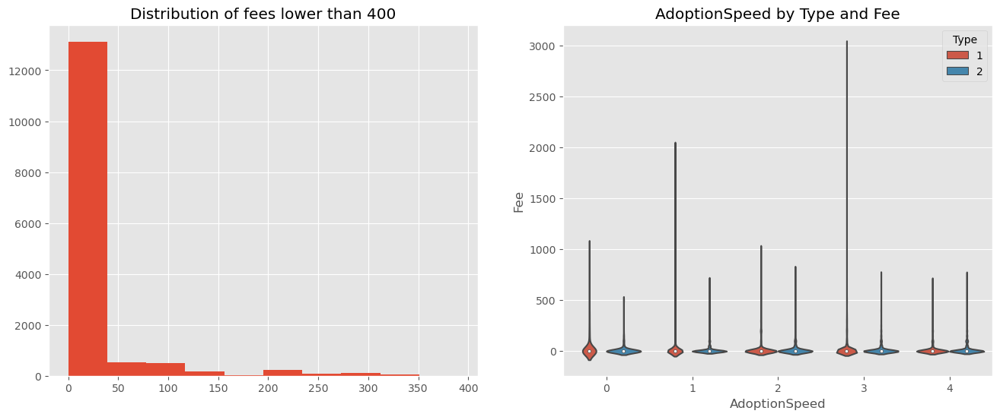

In [111]:
plt.figure(figsize=(16, 6));
plt.subplot(1, 2, 1)
plt.hist(train.loc[train['Fee'] < 400, 'Fee']);
plt.title('Distribution of fees lower than 400');

plt.subplot(1, 2, 2)
sns.violinplot(x="AdoptionSpeed", y="Fee", hue="Type", data=train);
plt.title('AdoptionSpeed by Type and Fee');
# Maybe people prefer to pay for "better" pets: healthy, trained and so on

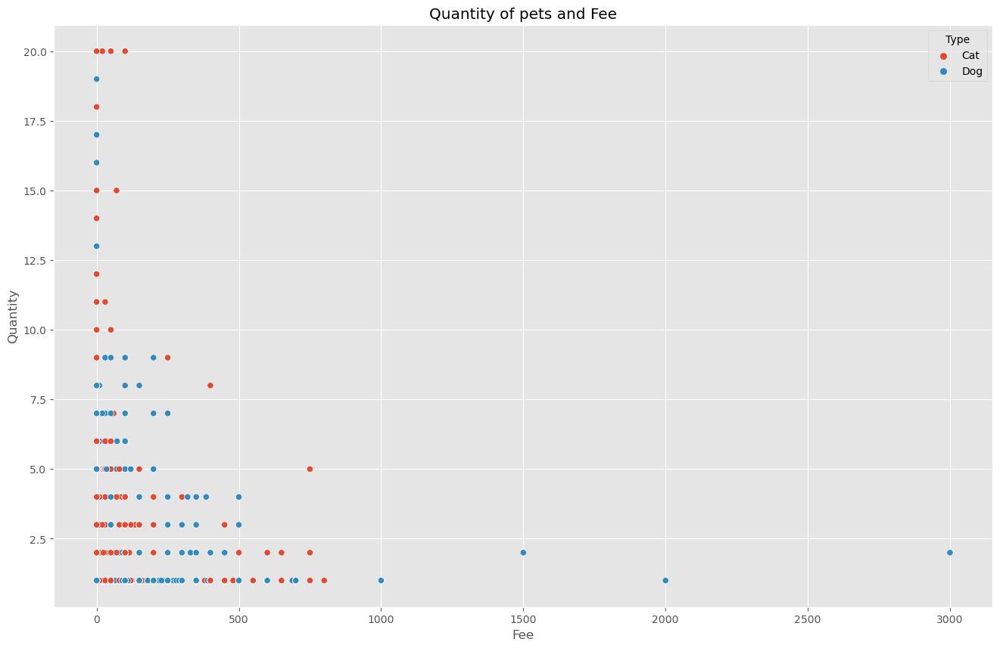

In [112]:
all_data.sort_values('Fee', ascending=False)[['Name', 'Description', 'Fee', 'AdoptionSpeed', 'dataset_type']].head(10)
plt.figure(figsize=(16, 10));
sns.scatterplot(x="Fee", y="Quantity", hue="Type",data=all_data);
plt.title('Quantity of pets and Fee');
# The less pets, the higher is the fee.

In [113]:
states_dict = {k: v for k, v in zip(states['StateID'], states['StateName'])}
train['State_name'] = train['State'].apply(lambda x: '_'.join(states_dict[x].split()) if x in states_dict else 'Unknown')
test['State_name'] = test['State'].apply(lambda x: '_'.join(states_dict[x].split()) if x in states_dict else 'Unknown')
all_data['State_name'] = all_data['State'].apply(lambda x: '_'.join(states_dict[x].split()) if x in states_dict else 'Unknown')
all_data['State_name'].value_counts(normalize=True).head()

State_name
Selangor        0.556130
Kuala_Lumpur    0.259267
Pulau_Pinang    0.071342
Johor           0.033430
Perak           0.029897
Name: proportion, dtype: float64

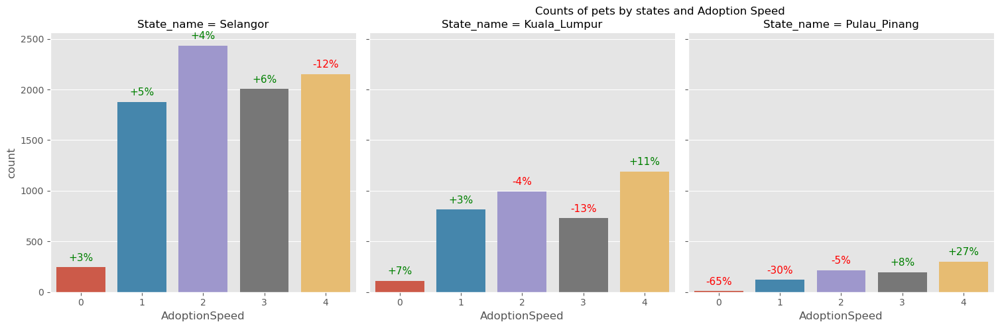

In [115]:
make_factor_plot(df=train.loc[train['State_name'].isin(list(train.State_name.value_counts().index[:3]))], x='State_name', col='AdoptionSpeed', title='Counts of pets by states and Adoption Speed')
# Intetestingly top-2 and top-3 states have lower rates of adoption.

In [116]:
all_data['RescuerID'].value_counts().head()

RescuerID
fa90fa5b1ee11c86938398b60abc32cb    459
aa66486163b6cbc25ea62a34b11c9b91    315
c00756f2bdd8fa88fc9f07a8309f7d5d    231
b53c34474d9e24574bcec6a3d3306a0d    228
62a25cadb85658be5275bd54a3b8c76d    162
Name: count, dtype: int64

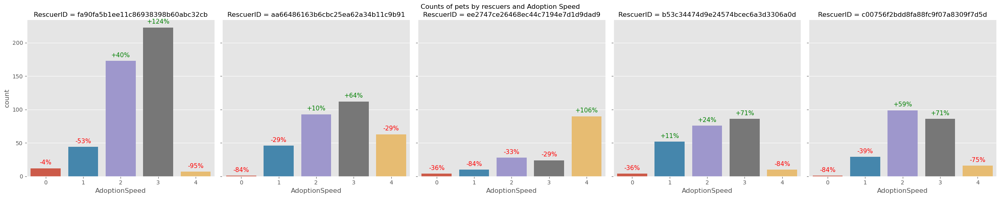

In [117]:
make_factor_plot(df=train.loc[train['RescuerID'].isin(list(train.RescuerID.value_counts().index[:5]))], x='RescuerID', col='AdoptionSpeed', title='Counts of pets by rescuers and Adoption Speed', col_wrap=5)

In [119]:
train['VideoAmt'].value_counts()
# In most cases there are no videos at all. Sometimes there is one video

VideoAmt
0    14419
1      417
2       92
3       36
4       15
5        7
6        4
8        2
7        1
Name: count, dtype: int64

In [120]:
print(F'Maximum amount of photos in {train["PhotoAmt"].max()}')
train['PhotoAmt'].value_counts().head()

Maximum amount of photos in 30.0


PhotoAmt
1.0    3075
2.0    2518
3.0    2511
5.0    2147
4.0    1881
Name: count, dtype: int64

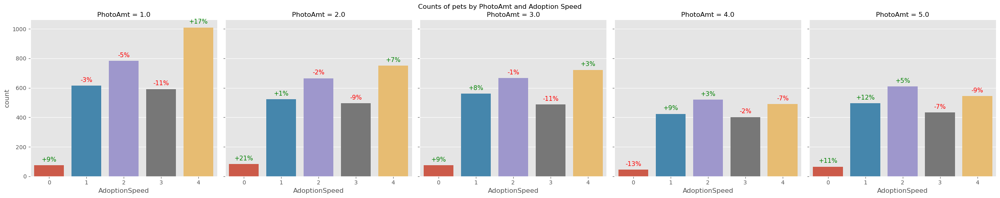

In [121]:
make_factor_plot(df=train.loc[train['PhotoAmt'].isin(list(train.PhotoAmt.value_counts().index[:5]))], x='PhotoAmt', col='AdoptionSpeed', title='Counts of pets by PhotoAmt and Adoption Speed', col_wrap=5)

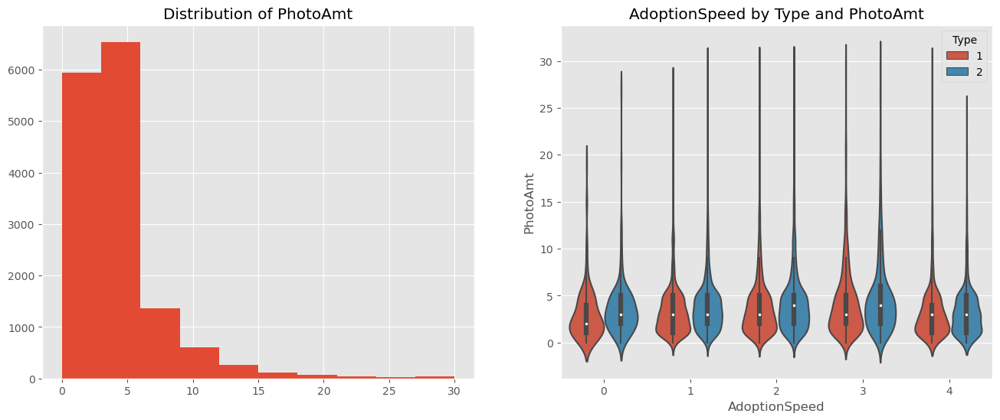

In [122]:
plt.figure(figsize=(16, 6));
plt.subplot(1, 2, 1)
plt.hist(train['PhotoAmt']);
plt.title('Distribution of PhotoAmt');

plt.subplot(1, 2, 2)
sns.violinplot(x="AdoptionSpeed", y="PhotoAmt", hue="Type", data=train);
plt.title('AdoptionSpeed by Type and PhotoAmt');
# Pets can have up to 30 photos! That's a lot! 

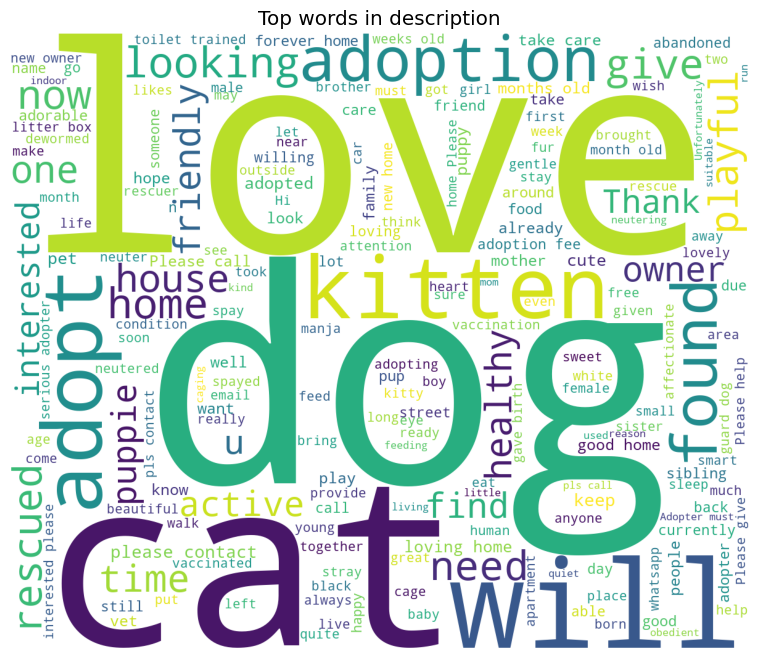

In [123]:
fig, ax = plt.subplots(figsize = (12, 8))
text_cat = ' '.join(all_data['Description'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white',
                      width=1200, height=1000).generate(text_cat)
plt.imshow(wordcloud)
plt.title('Top words in description');
plt.axis("off");

In [124]:
tokenizer = TweetTokenizer()
vectorizer = TfidfVectorizer(ngram_range=(1, 2), tokenizer=tokenizer.tokenize)

vectorizer.fit(all_data['Description'].fillna('').values)
X_train = vectorizer.transform(train['Description'].fillna(''))

rf = RandomForestClassifier(n_estimators=20)
rf.fit(X_train, train['AdoptionSpeed'])

RandomForestClassifier(n_estimators=20)

In [126]:
for i in range(5):
    print(f'Example of Adoption speed {i}')
    text = train.loc[train['AdoptionSpeed'] == i, 'Description'].values[0]
    print(text)
    display(eli5.show_prediction(rf, doc=text, vec=vectorizer, top=10))

Example of Adoption speed 0
I just found it alone yesterday near my apartment. It was shaking so I had to bring it home to provide temporary care.


Example of Adoption speed 1
anyone within the area of ipoh or taiping who interested to adopt my cat can contact my father at this number (mazuvil)or can just email me. currently bulat is at my hometown at perak but anyone outside the area still want to adopt can travel there to my hometown.there is a lot of cats in my house rite now..i think i should let one of them go to a better owner who can give better attention to him.


Example of Adoption speed 2
Nibble is a 3+ month old ball of cuteness. He is energetic and playful. I rescued a couple of cats a few months ago but could not get them neutered in time as the clinic was fully scheduled. The result was this little kitty. I do not have enough space and funds to care for more cats in my household. Looking for responsible people to take over Nibble's care.


Example of Adoption speed 3
Their pregnant mother was dumped by her irresponsible owner at the roadside near some shops in Subang Jaya. Gave birth to them at the roadside. They are all healthy and adorable puppies. Already dewormed, vaccinated and ready to go to a home. No tying or caging for long hours as guard dogs. However, it is acceptable to cage or tie for precautionary purposes. Interested to adopt pls call me.


Example of Adoption speed 4
Very manja and gentle stray cat found, we would really like to find a home for it because we cannot keep her for ourselves for long. Has a very cute high pitch but soft meow. Please contact me if you would be interested in adopting.


In [127]:
train['Description'] = train['Description'].fillna('')
test['Description'] = test['Description'].fillna('')
all_data['Description'] = all_data['Description'].fillna('')

train['desc_length'] = train['Description'].apply(lambda x: len(x))
train['desc_words'] = train['Description'].apply(lambda x: len(x.split()))

test['desc_length'] = test['Description'].apply(lambda x: len(x))
test['desc_words'] = test['Description'].apply(lambda x: len(x.split()))

all_data['desc_length'] = all_data['Description'].apply(lambda x: len(x))
all_data['desc_words'] = all_data['Description'].apply(lambda x: len(x.split()))

train['averate_word_length'] = train['desc_length'] / train['desc_words']
test['averate_word_length'] = test['desc_length'] / test['desc_words']
all_data['averate_word_length'] = all_data['desc_length'] / all_data['desc_words']

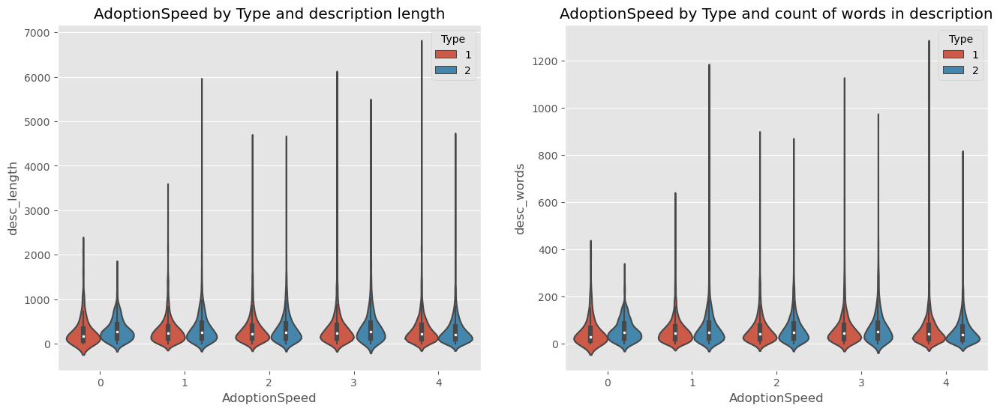

In [128]:
plt.figure(figsize=(16, 6));
plt.subplot(1, 2, 1)
sns.violinplot(x="AdoptionSpeed", y="desc_length", hue="Type", data=train);
plt.title('AdoptionSpeed by Type and description length');

plt.subplot(1, 2, 2)
sns.violinplot(x="AdoptionSpeed", y="desc_words", hue="Type", data=train);
plt.title('AdoptionSpeed by Type and count of words in description');
# short text in ads are adopted quickly

In [130]:
sentiment_dict = {}
for filename in os.listdir(f'{folder_name}/train_sentiment/'):
    with open(f'{folder_name}/train_sentiment/' + filename, 'r') as f:
        sentiment = json.load(f)
    pet_id = filename.split('.')[0]
    sentiment_dict[pet_id] = {}
    sentiment_dict[pet_id]['magnitude'] = sentiment['documentSentiment']['magnitude']
    sentiment_dict[pet_id]['score'] = sentiment['documentSentiment']['score']
    sentiment_dict[pet_id]['language'] = sentiment['language']

for filename in os.listdir(f'{folder_name}/test_sentiment/'):
    with open(f'{folder_name}/test_sentiment/' + filename, 'r') as f:
        sentiment = json.load(f)
    pet_id = filename.split('.')[0]
    sentiment_dict[pet_id] = {}
    sentiment_dict[pet_id]['magnitude'] = sentiment['documentSentiment']['magnitude']
    sentiment_dict[pet_id]['score'] = sentiment['documentSentiment']['score']
    sentiment_dict[pet_id]['language'] = sentiment['language']

In [131]:
train['lang'] = train['PetID'].apply(lambda x: sentiment_dict[x]['language'] if x in sentiment_dict else 'no')
train['magnitude'] = train['PetID'].apply(lambda x: sentiment_dict[x]['magnitude'] if x in sentiment_dict else 0)
train['score'] = train['PetID'].apply(lambda x: sentiment_dict[x]['score'] if x in sentiment_dict else 0)

test['lang'] = test['PetID'].apply(lambda x: sentiment_dict[x]['language'] if x in sentiment_dict else 'no')
test['magnitude'] = test['PetID'].apply(lambda x: sentiment_dict[x]['magnitude'] if x in sentiment_dict else 0)
test['score'] = test['PetID'].apply(lambda x: sentiment_dict[x]['score'] if x in sentiment_dict else 0)

all_data['lang'] = all_data['PetID'].apply(lambda x: sentiment_dict[x]['language'] if x in sentiment_dict else 'no')
all_data['magnitude'] = all_data['PetID'].apply(lambda x: sentiment_dict[x]['magnitude'] if x in sentiment_dict else 0)
all_data['score'] = all_data['PetID'].apply(lambda x: sentiment_dict[x]['score'] if x in sentiment_dict else 0)

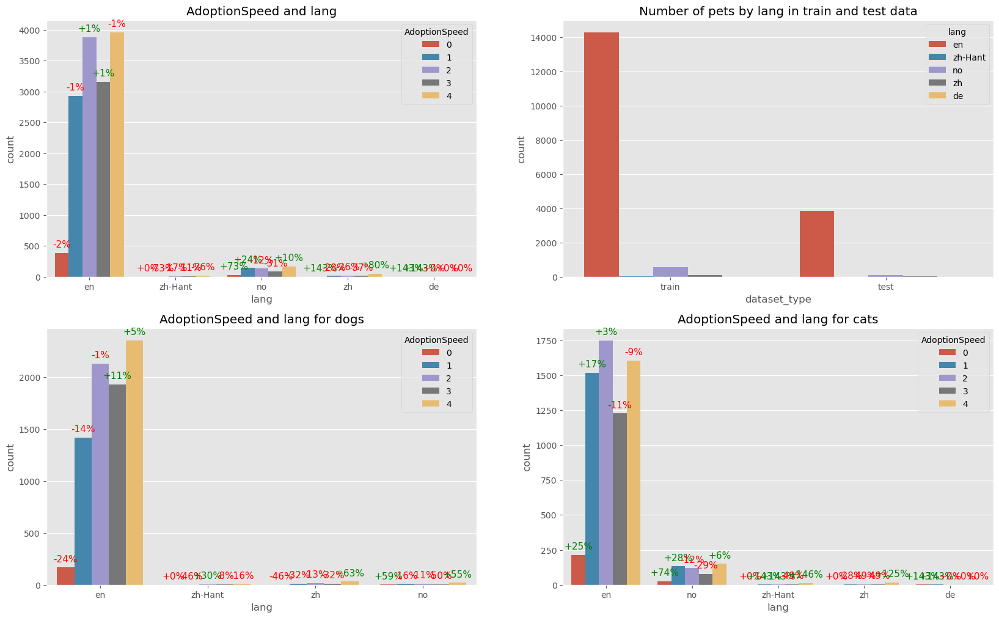

In [132]:
plot_four_graphs(col='lang', main_title='lang', dataset_title='Number of pets by lang in train and test data')

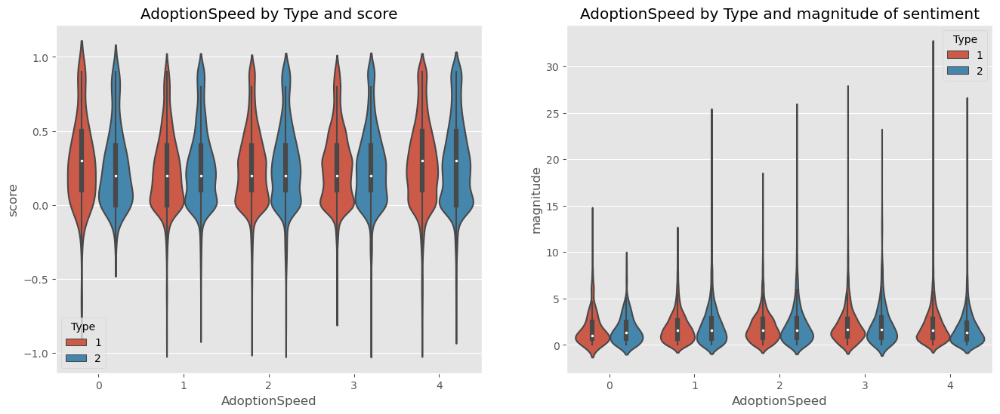

In [133]:
plt.figure(figsize=(16, 6));
plt.subplot(1, 2, 1)
sns.violinplot(x="AdoptionSpeed", y="score", hue="Type", data=train);
plt.title('AdoptionSpeed by Type and score');

plt.subplot(1, 2, 2)
sns.violinplot(x="AdoptionSpeed", y="magnitude", hue="Type", data=train);
plt.title('AdoptionSpeed by Type and magnitude of sentiment');
# It seems that the lower is the magnitude of score, the faster pets are adopted.

In [134]:
cols_to_use = ['Type', 'Age', 'Breed1', 'Breed2', 'Gender', 'Color1', 'Color2',
       'Color3', 'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'Health', 'Quantity', 'Fee', 'State', 'RescuerID', 'health', 'Free', 'score',
       'VideoAmt', 'PhotoAmt', 'AdoptionSpeed', 'No_name', 'Pure_breed', 'desc_length', 'desc_words', 'averate_word_length', 'magnitude']
train = train[[col for col in cols_to_use if col in train.columns]]
test = test[[col for col in cols_to_use if col in test.columns]]

In [135]:
cat_cols = ['Type', 'Breed1', 'Breed2', 'Gender', 'Color1', 'Color2',
       'Color3', 'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'Health', 'State', 'RescuerID',
       'No_name', 'Pure_breed', 'health', 'Free']

In [136]:
more_cols = []
for col1 in cat_cols:
    for col2 in cat_cols:
        if col1 != col2 and col1 not in ['RescuerID', 'State'] and col2 not in ['RescuerID', 'State']:
            train[col1 + '_' + col2] = train[col1].astype(str) + '_' + train[col2].astype(str)
            test[col1 + '_' + col2] = test[col1].astype(str) + '_' + test[col2].astype(str)
            more_cols.append(col1 + '_' + col2)
            
cat_cols = cat_cols + more_cols

KeyError: 'No_name'

In [ ]:
params = {'num_leaves': 512,
        #  'min_data_in_leaf': 60,
         'objective': 'multiclass',
         'max_depth': -1,
         'learning_rate': 0.01,
         "boosting": "gbdt",
         "feature_fraction": 0.9,
         "bagging_freq": 3,
         "bagging_fraction": 0.9,
         "bagging_seed": 11,
        #  "lambda_l1": 0.1,
         # "lambda_l2": 0.1,
         "random_state": 42,          
         "verbosity": -1,
         "num_class": 5}

In [ ]:
result_dict_lgb = train_model(X=train, X_test=test, y=y, params=params, model_type='lgb', plot_feature_importance=True, make_oof=True)

In [ ]:
xgb_params = {'eta': 0.01, 'max_depth': 9, 'subsample': 0.9, 'colsample_bytree': 0.9, 
          'objective': 'multi:softprob', 'eval_metric': 'merror', 'silent': True, 'nthread': 4, 'num_class': 5}
result_dict_xgb = train_model(params=xgb_params, model_type='xgb', make_oof=True)

In [ ]:
prediction = (result_dict_lgb['prediction'] + result_dict_xgb['prediction']).argmax(1)
submission = pd.DataFrame({'PetID': sub.PetID, 'AdoptionSpeed': [int(i) for i in prediction]})
submission.head()